# Week 8<br>Analyzing and Visualizing Large Datasets

- November 7 & 14 2024

Working with big data

**By example:**
- Open Street Map data
- Census data
- NYC taxi cab trips (next time)

In [209]:
!pip install "pandas>=2"
!pip install pyproj

In [210]:
# Initial imports
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import warnings

## The holoViz ecosystem (revisited)

**3 new packages:**
- Dask: analyzing large datasets
- Intake: loading data sets into Python
- Datashader: visualizing large data sets

![](imgs/holoviz.png)

## First up: dask

Out-of-core (larger-than-memory) operations in Python

**Extends the maximum file size from the size of memory to the size of your hard drive**

### Dask dataframes

- Syntax mirrors the Pandas DataFrame object
- Uses the task graph functionality to provides a unified interface to multiple pandas DataFrame objects.

<center>
    <img src="imgs/dask-dataframes.png" width=400/>
</center>

### Enables out-of-core operations

Pandas DataFrames don't need to fit into memory...when evaluating an expression, dask will load the data into memory when necessary.

**Let's try it out:**

Loading 1 billion Open Street Map points...

[Source](https://blog.openstreetmap.org/2012/04/01/bulk-gps-point-data/)

## Loading data with intake

- [Intake](https://intake.readthedocs.io/en/latest/) helps make loading data into Python very easy
- Works with the holoViz ecosystem, including dask
- We'll load the OSM data from Amazon s3:
    - http://s3.amazonaws.com/datashader-data/osm-1billion.snappy.parq.zip
    - (or you can do it locally)


### An intake "catalog"

- Metadata that tells Python where and how to download data
- On first download, the data is cached locally to avoid repeated downloaded
- Creates a standard way of sharing datasets 

See [datasets.yml](https://github.com/MUSA-550-Fall-2023/week-8/blob/main/datasets.yml) in this week's repository.

### Load our intake catalog

In [211]:
import intake

In [212]:
datasets = intake.open_catalog("./datasets.yml")

### Which datasets do we have?

In [213]:
list(datasets) 

['nyc_taxi_wide', 'census', 'osm']

### 3 "big data" examples today

- 1 billion OSM points: http://s3.amazonaws.com/datashader-data/osm-1billion.parq.zip
- NYC taxi trips: https://s3.amazonaws.com/datashader-data/nyc_taxi_wide.parq 
- 2010 Census data: http://s3.amazonaws.com/datashader-data/census2010.parq.zip

## Example 1: OSM data points

### Convert the data to a dask array: `to_dask()`

- This step downloads the data. 
- The first time you run it, you should see a progress bar documenting the download progress. 
- Given the size of the data files (> 1 GB), the download can take several minutes.

In [214]:
type(datasets.osm)

intake_parquet.source.ParquetSource

In [14]:
#pip install "dask[dataframe]"

In [15]:
#pip install pyarrow

This is one approach to access the file, but I prefer accessing locally.

In [219]:
#osm_ddf = datasets.osm.to_dask()

alternatively, you can load the file from your local folder

In [220]:
import dask.dataframe as dd
osm_ddf = dd.read_parquet('osm-1billion.parq', engine='pyarrow')

In [221]:
osm_ddf

,x,y
npartitions=119,,
,float32,float32
,...,...
...,...,...
,...,...
,...,...


- The data frame is sub-divided into 119 partitions and only one partition will be loaded into memory at a time.
- No actual data has been loaded from the file yet!

### Let's load the data for the first partition to peek at the head of the file

Only the data necessary to see the head of the file will be loaded.

In [222]:
# we can still get the head of the file quickly
osm_ddf.head(n=10)

,x,y
0,-16274360.0,-17538778.0
1,-16408889.0,-16618700.0
2,-16246231.0,-16106805.0
3,-19098164.0,-14783157.0
4,-17811662.0,-13948767.0
5,-17751736.0,-13926740.0
6,-17711376.0,-13921245.0
7,-17532738.0,-13348323.0
8,-19093358.0,-10380358.0
9,-19077458.0,-10445329.0


### Note: What geographic coordinates? 

- Data is in Web Mercator (EPSG=3857) coordinates
- Units are meters

### How about the size of the data frame?

All data partitions must be loaded for this calculation...it will take longer!

In [223]:
# getting the length means all of the data must be loaded though
nrows = len(osm_ddf)
print(f"number of rows = {nrows}")

number of rows = 1000050363


**1 billion rows!**

### Let's do some simple calculations

In [224]:
# mean x/y coordinates
mean_x = osm_ddf['x'].mean()
mean_y = osm_ddf['y'].mean()

print(mean_x, mean_y)

<dask_expr.expr.Scalar: expr=ReadParquetFSSpec(f68ac1b)['x'].mean(), dtype=float32> <dask_expr.expr.Scalar: expr=ReadParquetFSSpec(f68ac1b)['y'].mean(), dtype=float32>


In [225]:
# evaluate the expressions
print("mean x = ", mean_x.compute())

mean x =  2731828.836864097


In [226]:
# evaluate the expressions
print("mean y = ", mean_y.compute())

mean y =  5801830.125332437


### Now let's visualize the points...but how?

### Not with matplotlib...

Matplotlib struggles with only hundreds of points

### Enter Datashader

"Turns even the largest data into images, accurately"

Datashader is a library that produces a "rasterized" image of large datasets, such that the visual color mapping is a fair representation of the underlying data.

### The Datashader pipeline

1. Aggregate data onto a pixelized image
1. Map aggregated data to colors to properly represent density of data

Recommended reading: [Understanding the datashader algorithm](https://datashader.org/getting_started/Pipeline.html)

![](imgs/datashader-pipeline.png)

In [227]:
# Datashader imports
import datashader as ds
import datashader.transfer_functions as tf

In [228]:
# Color-related imports
from datashader.colors import Greys9, viridis, inferno
from colorcet import fire

### Steps:

1. Initialize a datashader Canvas() with a specific width & height and x & y ranges ("extent")
1. Aggregate the x/y points on the canvas into pixels, using a specified aggregation function

- `datashader` requires Web Mercator coordinates (EPSG=3857)
- In this case, the data is already in the right coordinates so no transformation is needed

Set up the global datashader canvas:


In [229]:
# Web Mercator bounds
bound = 20026376.39
global_x_range = (-bound, bound)
global_y_range = (int(-bound*0.4), int(bound*0.6))

# Default width and height
global_plot_width = 900
global_plot_height = int(global_plot_width*0.5)

In [230]:
#!pip install --upgrade datashader dask


In [232]:
import warnings
warnings.filterwarnings("ignore") 

# Your other imports
import datashader as ds
import dask.dataframe as dd

# Initialize your canvas for the plot
canvas = ds.Canvas(
    plot_width=global_plot_width,
    plot_height=global_plot_height,
    x_range=global_x_range,
    y_range=global_y_range,
)

# Assuming osm_ddf is your Dask DataFrame, use Datashader to create an aggregation
agg = canvas.points(osm_ddf, "x", "y", agg=ds.count())

Note: The aggregated pixels are stored using *xarray*

In [233]:
agg

<xarray.DataArray (y: 450, x: 900)> Size: 2MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint32)
Coordinates:
  * x        (x) float64 7kB -2e+07 -1.996e+07 -1.992e+07 ... 1.996e+07 2e+07
  * y        (y) float64 4kB -7.988e+06 -7.944e+06 ... 1.195e+07 1.199e+07
Attributes:
    x_range:  (-20026376.39, 20026376.39)
    y_range:  (-8010550, 12015825)

### Steps (continued)

3. Perform the "shade" operation — map the pixel values to a color map

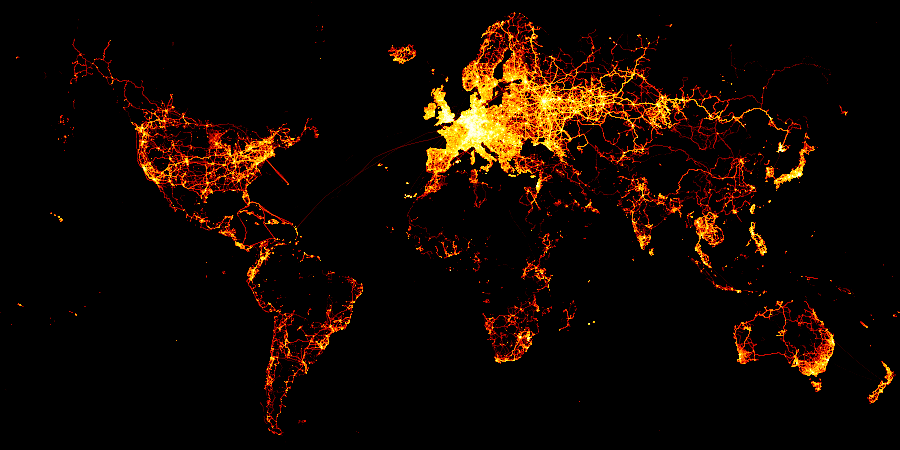

In [234]:
# Step 3: Perform the shade operation
img = tf.shade(agg, cmap=fire)

# Format: set the background of the image to black so it looks better
img = tf.set_background(img, "black")

img

### Improvement: Remove noise from pixels with low counts

**Remember:** our `agg` variable is an xarray DataArray. 

So, we can leverage xarray's builtin `where()` function to select a subsample of the pixels based on the pixel counts.

In [239]:
selected = agg.where(agg > 15)
selected

<xarray.DataArray (y: 450, x: 900)> Size: 3MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * x        (x) float64 7kB -2e+07 -1.996e+07 -1.992e+07 ... 1.996e+07 2e+07
  * y        (y) float64 4kB -7.988e+06 -7.944e+06 ... 1.195e+07 1.199e+07
Attributes:
    x_range:  (-20026376.39, 20026376.39)
    y_range:  (-8010550, 12015825)

### This will mask pixels that do not satisfy the `where` condition  — masked pixels are set to NaN

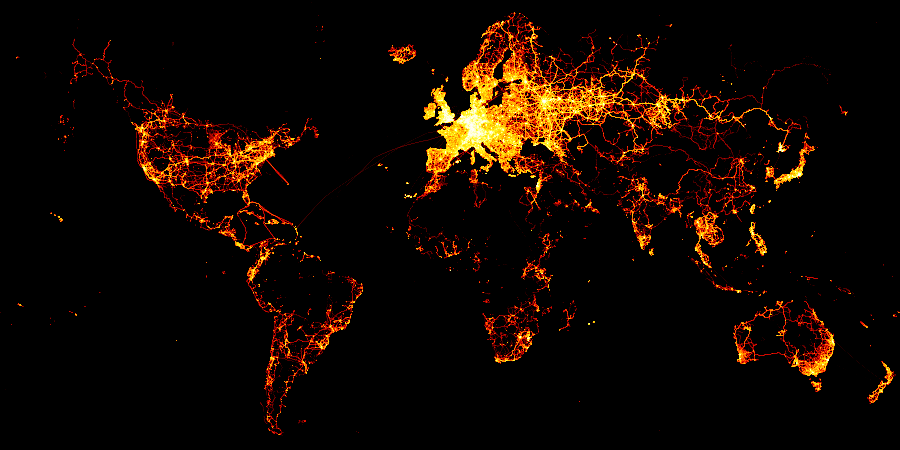

In [240]:
# plot the masked data
tf.set_background(tf.shade(selected, cmap=fire),"black")

## Example 2: Revisiting the census dot map

We can use datashader to visualize all 300 million census dots to make a *nationwide* version of the racial dot map we saw earlier.

In [244]:
!pip install fastparquet
!pip install pyarrow

Specify the engine directly

- remember that you can also download this data locally, and it will go faster.

In [246]:
import pyarrow.parquet as pq
import pyarrow as pa
import dask.dataframe as dd
import pandas as pd  # Make sure to import pandas
import os

# Directory containing the Parquet files
parquet_dir = "census2010.parq"

# Function to convert 'race' column from binary to string
def convert_binary_to_string(table):
    # Manually cast the binary column to string
    if 'race' in table.column_names:
        race_column = table['race']
        race_column = race_column.cast(pa.string())  # Cast binary to string
        table = table.set_column(table.schema.get_field_index('race'), 'race', race_column)
    return table

# Function to read and process a single Parquet file
def process_parquet_file(file_path):
    # Read the Parquet file
    parquet_file = pq.ParquetFile(file_path)
    
    # Read the data into a PyArrow table
    table = parquet_file.read()
    
    # Convert binary columns to string (if needed)
    table = convert_binary_to_string(table)
    
    # Convert to Pandas DataFrame and return
    return table.to_pandas()

# Get all Parquet files in the directory
parquet_files = [os.path.join(parquet_dir, f) for f in os.listdir(parquet_dir) if f.endswith('.parquet')]

# Read and process each Parquet file
dfs = []
for file_path in parquet_files:
    print(f"Processing {file_path}...")
    df = process_parquet_file(file_path)
    dfs.append(df)

# Combine all the DataFrames into one Dask DataFrame
census_ddf = dd.from_pandas(pd.concat(dfs), npartitions=4)

# Show the first few rows
print(census_ddf.head())


Processing census2010.parq/part.33.parquet...
Processing census2010.parq/part.23.parquet...
Processing census2010.parq/part.15.parquet...
Processing census2010.parq/part.4.parquet...
Processing census2010.parq/part.14.parquet...
Processing census2010.parq/part.5.parquet...
Processing census2010.parq/part.22.parquet...
Processing census2010.parq/part.32.parquet...
Processing census2010.parq/part.16.parquet...
Processing census2010.parq/part.29.parquet...
Processing census2010.parq/part.7.parquet...
Processing census2010.parq/part.30.parquet...
Processing census2010.parq/part.20.parquet...
Processing census2010.parq/part.21.parquet...
Processing census2010.parq/part.31.parquet...
Processing census2010.parq/part.17.parquet...
Processing census2010.parq/part.28.parquet...
Processing census2010.parq/part.6.parquet...
Processing census2010.parq/part.3.parquet...
Processing census2010.parq/part.12.parquet...
Processing census2010.parq/part.34.parquet...
Processing census2010.parq/part.24.parq

### Note: What geographic coordinates? 

- Once again, data is in Web Mercator (EPSG=3857) coordinates
- "easting" is the x coordinate and "northing" is the y coordinate
- Units are meters

In [247]:
print("number of rows =", len(census_ddf))

number of rows = 306675004


### Roughly 300 million rows: 1 for each person in the U.S. population

### Set up bounds for major cities and USA

**Important:** datashader has a utility function to convert from latitude/longitude (EPSG=4326) to Web Mercator (EPSG=3857)

See: `lnglat_to_meters()`

In [248]:
from datashader.utils import lnglat_to_meters

In [260]:
# Sensible lat/lng coordinates for U.S. cities
# NOTE: these are in lat/lng so EPSG=4326
USA           = [(-124.72,  -66.95), (23.55, 50.06)]
Chicago       = [( -88.29,  -87.30), (41.57, 42.00)]
NewYorkCity   = [( -74.39,  -73.44), (40.51, 40.91)]
LosAngeles    = [(-118.53, -117.81), (33.63, 33.96)]
Houston       = [( -96.05,  -94.68), (29.45, 30.11)]
Austin        = [( -97.91,  -97.52), (30.17, 30.37)]
NewOrleans    = [( -90.37,  -89.89), (29.82, 30.05)]
Atlanta       = [( -84.88,  -84.04), (33.45, 33.84)]
Philly        = [( -75.28,  -74.96), (39.86, 40.14)]

USA     =  [(-12472000.0, -6695000.0), (2355000.0, 5006000.0)]
Chicago =  [(-8829000.0, -8730000.0), (4157000.0, 4200000.0)]
NewYorkCity=  [(-7439000.0, -7344000.0), (4051000.0, 4091000.0)]
LosAngeles=  [(-11853000.0, -11781000.0), (3363000.0, 3396000.0)]
Houston= [(-9605000.0, -9468000.0), (2945000.0, 3011000.0)]
Austin=  [(-9791000.0, -9752000.0), (3017000.0, 3037000.0)]
NewOrleans=  [(-9037000.0, -8989000.0), (2982000.0, 3005000.0)]
Atlanta=  [(-8488000.0, -8404000.0), (3345000.0, 3384000.0)]
Philadelphia=  [(-7528000.0, -7496000.0), (3986000.0, 4014000.0)]

# Get USA xlim and ylim in meters (EPSG=3857)
USA_xlim_meters, USA_ylim_meters = [list(r) for r in (USA[0], USA[1])]

In [251]:
# Define some a default plot width & height
plot_width  = int(900)
plot_height = int(plot_width*7.0/12)

### First, visualize the population density

**How about a linear color scale?**

In [261]:
USA_xlim_meters, USA_ylim_meters = [list(r) for r in (USA[0], USA[1])]
USA_xlim_meters


[-12472000.0, -6695000.0]

In [264]:
# Step 1: Setup the canvas
cvs = ds.Canvas(
    plot_width, plot_height, x_range=USA_xlim_meters, y_range=USA_ylim_meters
)

In [265]:
# Step 2: Aggregate the x/y points - that takes a very long time - consider using  a smaller subset
agg = cvs.points(census_ddf, "easting", "northing")

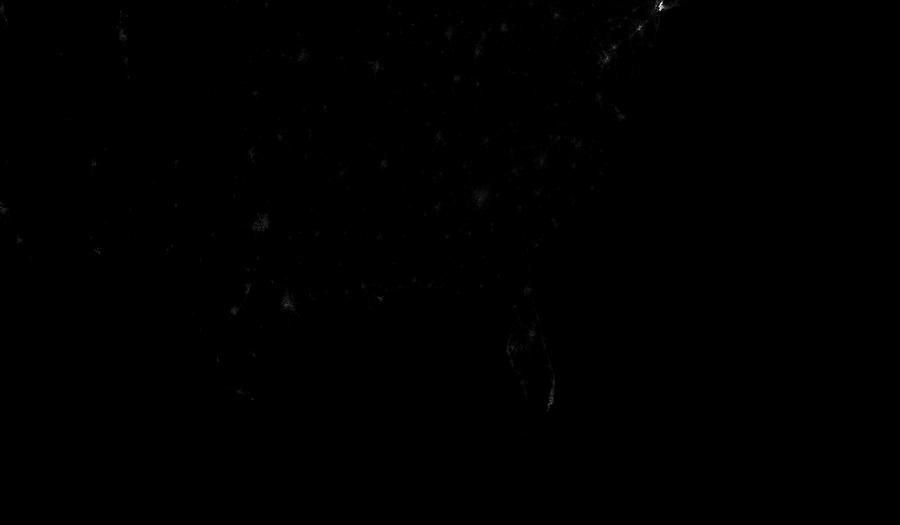

In [268]:
# Step 3: Shade with a "Grey" colormap and "linear" colormapping
img = tf.shade(agg, cmap=Greys9, how="linear")

# Format: Set the background
tf.set_background(img, "black")

**Okay, what about a log scale?**

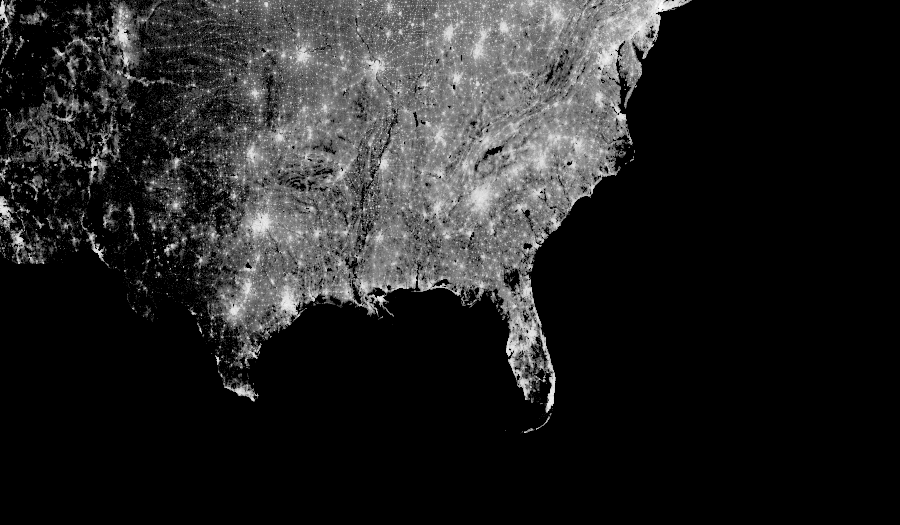

In [269]:
# Step 3: Shade with a "Grey" colormap and "log" colormapping
img = tf.shade(agg, cmap=Greys9, how='log')

# Format: add a black background
img = tf.set_background(img, 'black')
img

Let's use a *perceptually uniform* color map

<img src="imgs/colorcet.png" width=200></img>

**"A collection of perceptually accurate colormaps"**

See: https://colorcet.holoviz.org/

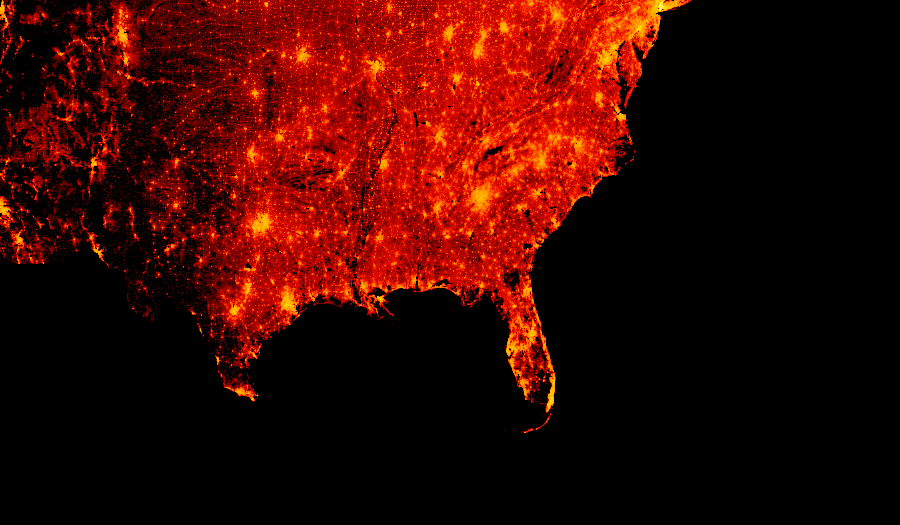

In [270]:
## Step 3: Shade with "fire" color scale and "log" colormapping
img = tf.shade(agg, cmap=fire, how='log')
tf.set_background(img, 'black')

### The best option: using the equal histogram method for shading

- This is the default shading option for color mapping in datashader
- A common [image processing](https://en.wikipedia.org/wiki/Histogram_equalization) technique for improving contrast and equalizing pixel values across images

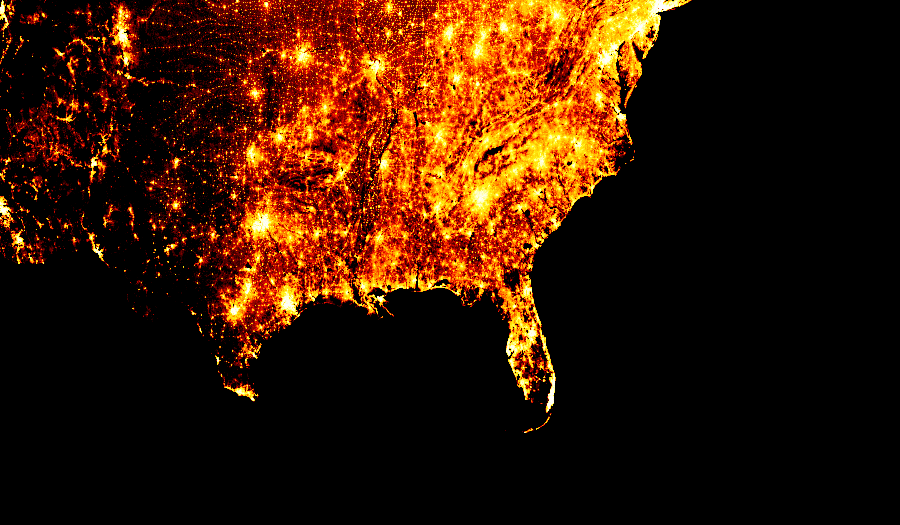

In [271]:
# Step 3: Shade with fire colormap and equalized histogram mapping
img = tf.shade(agg, cmap=fire, how='eq_hist')
tf.set_background(img, 'black')

**How about viridis?**

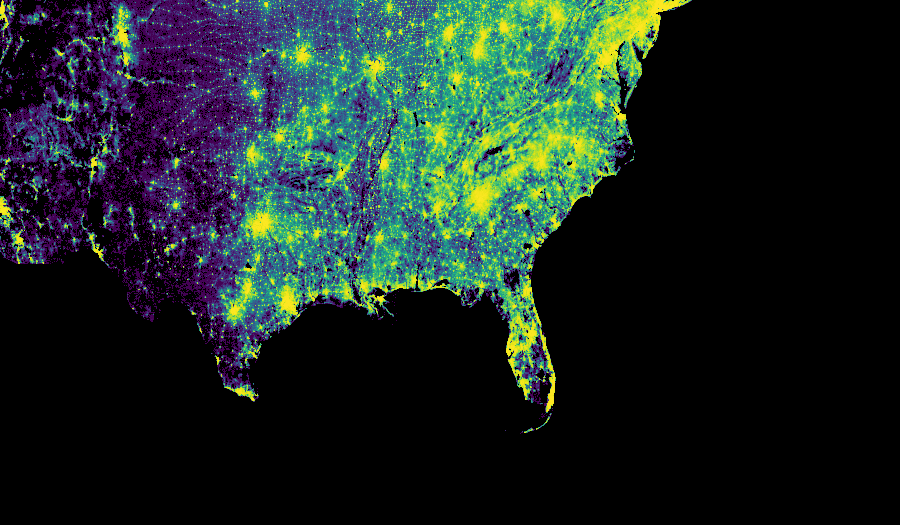

In [272]:
img = tf.shade(agg, cmap=viridis, how='eq_hist')
img = tf.set_background(img, 'black')
img

**How to save?**

Use the `export_image()` function.

In [273]:
from datashader.utils import export_image

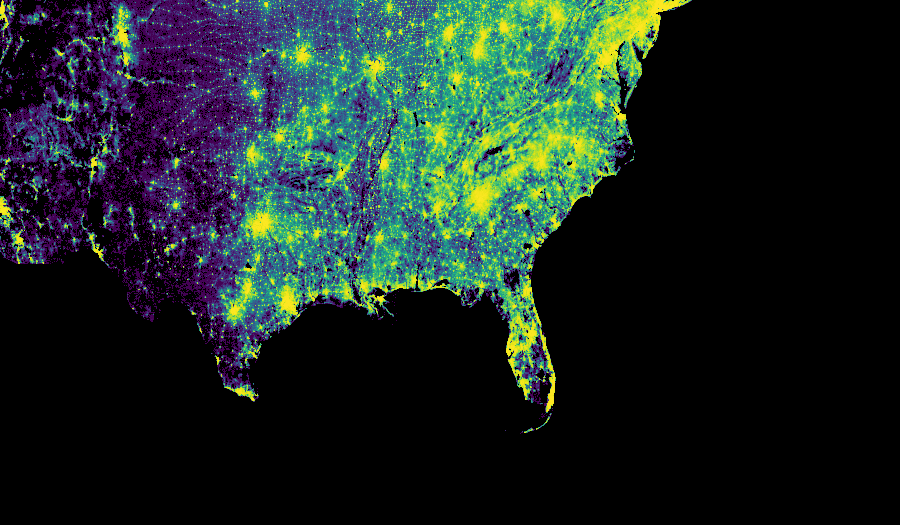

In [274]:
export_image(img, 'usa_census_viridis')

### Next, let's visualize race

Datashader can plot use different colors for different categories of data.

In [275]:
census_ddf.head()

,easting,northing,race
0,-9083972.0,3307315.75,h
0,-12808222.0,4323981.50,b
0,-8197708.5,4961214.50,w
0,-13148635.0,4011609.50,h
0,-9442149.0,4090975.50,w


In [276]:
# Set 'race' to a categorical dtype with the correct set of categories
census_ddf['race'] = census_ddf['race'].astype('category').cat.set_categories(["w", "b", "a", "h", "o"])

# Now perform the value counts
race_counts = census_ddf['race'].value_counts().compute()
race_counts


race
w    196052887
h     50317503
b     37643995
a     13914371
o      8746248
Name: count, dtype: int64

### Define a color scale for each race category

In [277]:
color_key = {"w": "aqua", "b": "lime", "a": "red", "h": "fuchsia", "o": "yellow"}

In [278]:
def create_census_image(longitude_range, latitude_range, w=plot_width, h=plot_height):
    """
    A function for plotting the Census data, coloring pixel by race values.
    """
    # Step 1: Calculate x and y range from lng/lat ranges
    x_range, y_range = lnglat_to_meters(longitude_range, latitude_range)

    # Step 2: Setup the canvas
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)

    # Step 3: Aggregate, but this time count the "race" category
    # NEW: specify the aggregation method to count the "race" values in each pixel
    agg = canvas.points(census_ddf, "easting", "northing", agg=ds.count_cat("race"))
    
    # Step 4: Shade, using our custom color map
    img = tf.shade(agg, color_key=color_key, how="eq_hist")

    # Return image with black background
    return tf.set_background(img, "black")

### Let's visualize all 300 million points

Color pixel values according to the demographics data in each pixel.

In [279]:
USA[0]

(-12472000.0, -6695000.0)

In [280]:
print(census_ddf['easting'].min().compute(), census_ddf['easting'].max().compute())
print(census_ddf['northing'].min().compute(), census_ddf['northing'].max().compute())


-13884029.0 -7453303.5
2818291.5 6335972.0


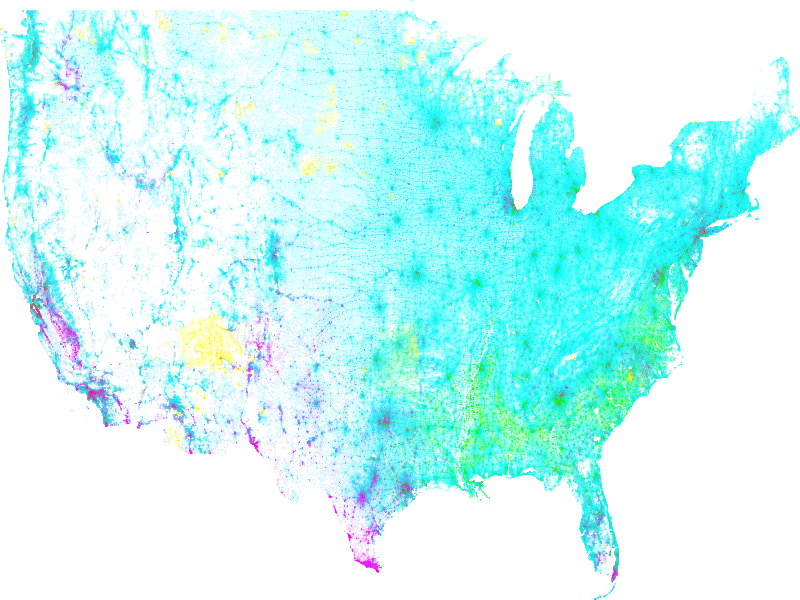

In [299]:
import dask.dataframe as dd
import pandas as pd

# Assume `census_ddf` is your Dask DataFrame and that "easting" and "northing" are columns.

# Function to scale the coordinates by dividing by 100000
def scale_coordinates(df):
    df['longitude'] = df['easting'] / 100000
    df['latitude'] = df['northing'] / 100000
    return df

# Apply the scaling using .map_partitions to each partition of the Dask DataFrame
census_ddf = census_ddf.map_partitions(scale_coordinates)

# Now that you have scaled lat/lon coordinates, you can use them for your plot
def create_census_image(longitude_range, latitude_range, w, h):
    x_range, y_range = longitude_range, latitude_range
    canvas = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)

    # Use count_cat to aggregate by the "race" category
    agg = canvas.points(census_ddf, "longitude", "latitude", agg=ds.count_cat("race"))

    img = tf.shade(agg, color_key=color_key, how="eq_hist")

    return img

In [309]:
# Inspect the coordinate range
lon_min, lon_max = census_ddf['longitude'].min().compute(), census_ddf['longitude'].max().compute()
lat_min, lat_max = census_ddf['latitude'].min().compute(), census_ddf['latitude'].max().compute()

# Adjust the ranges to focus on your data's actual location
longitude_range = (lon_min, lon_max)
latitude_range = (lat_min, lat_max)

longitude_range
latitude_range

(28.182915, 63.35972)

In [311]:
print(longitude_range)
print(latitude_range)

(-138.84029, -74.533035)
(28.182915, 63.35972)


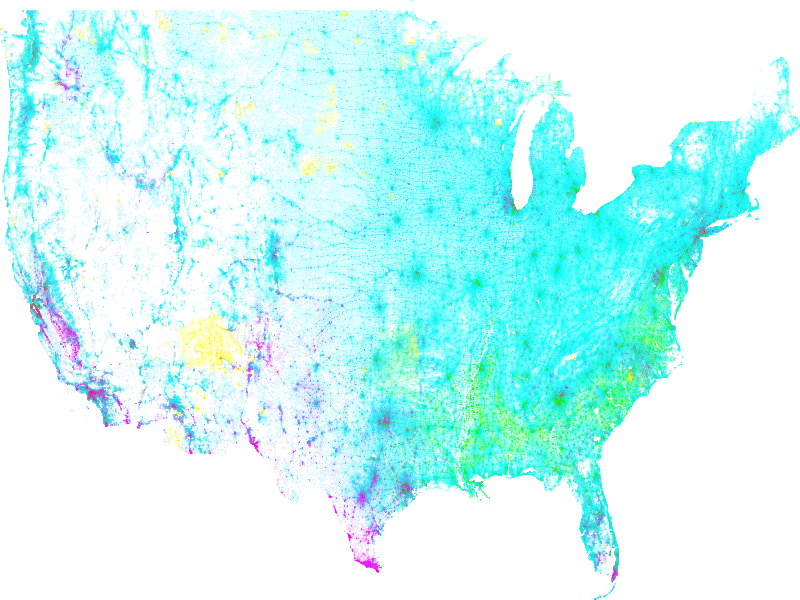

In [312]:
# Generate the image with the new range
img = create_census_image((-138.84029, -74.533035), (28.182915, 63.35972), w=800, h=600)
img

#### Remember: color scheme

- White: aqua
- Black/African American: lime
- Asian: red
- Hispanic: fuchsia
- Other: yellow

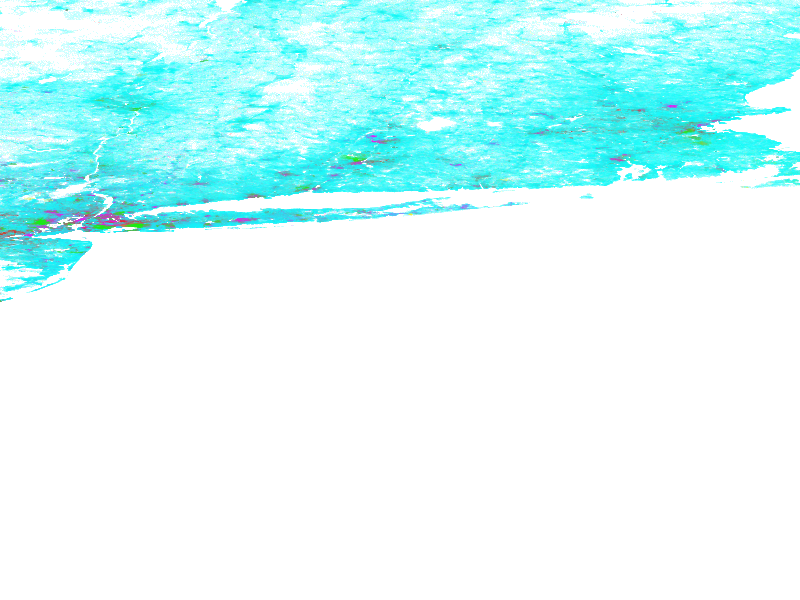

In [331]:
img = create_census_image((-82.84029, -78.533035), (40.182915, 55.35972), w=800, h=600)
img

In [290]:
USA           = [(-124.72,  -66.95), (23.55, 50.06)]
Chicago       = [( -88.29,  -87.30), (41.57, 42.00)]
NewYorkCity   = [( -74.39,  -73.44), (40.51, 40.91)]
LosAngeles    = [(-118.53, -117.81), (33.63, 33.96)]
Houston       = [( -96.05,  -94.68), (29.45, 30.11)]
Austin        = [( -97.91,  -97.52), (30.17, 30.37)]
NewOrleans    = [( -90.37,  -89.89), (29.82, 30.05)]
Atlanta       = [( -84.88,  -84.04), (33.45, 33.84)]
Philly        = [( -75.28,  -74.96), (39.86, 40.14)]

### At home exercise: what about other cities?

**Hint:** use the bounding boxes provided earlier to explore racial patterns across various major cities

#### New York City

#### Atlanta

#### Los Angeles

#### Houston

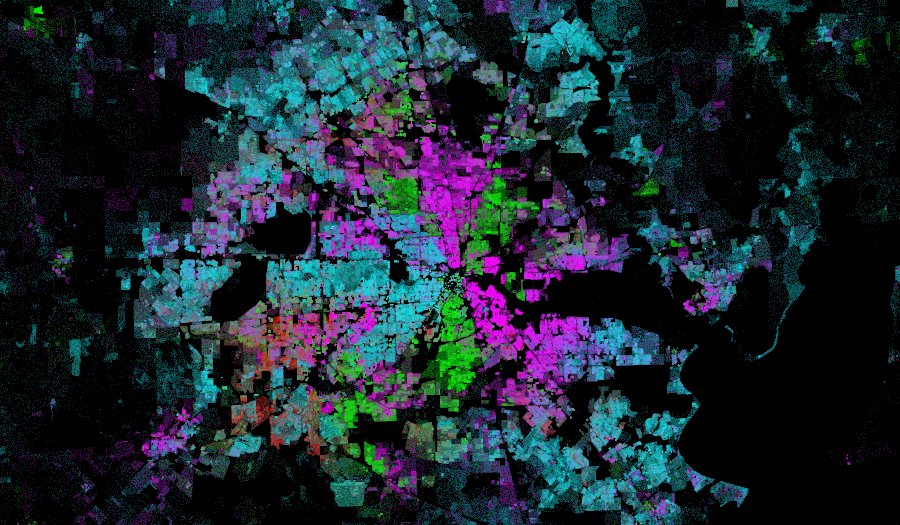

In [64]:
create_census_image(Houston[0], Houston[1])

#### Chicago

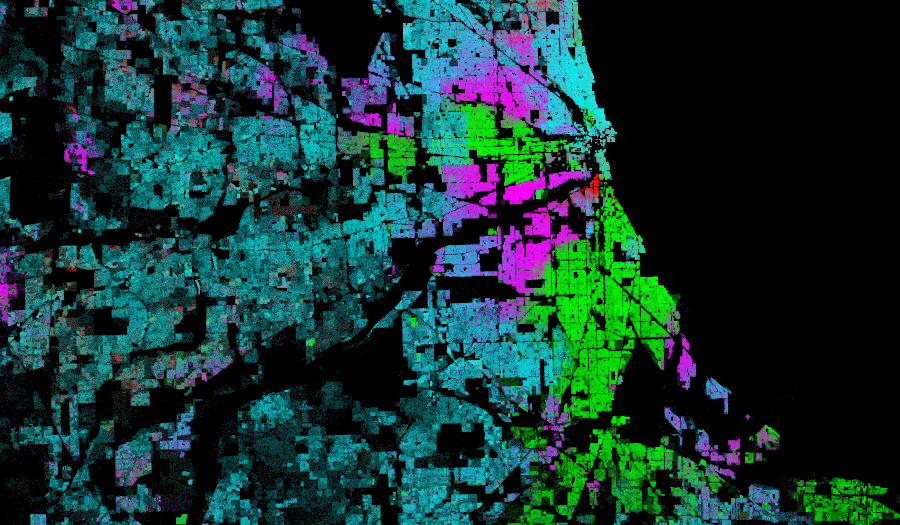

In [65]:
create_census_image(Chicago[0], Chicago[1])

#### New Orleans

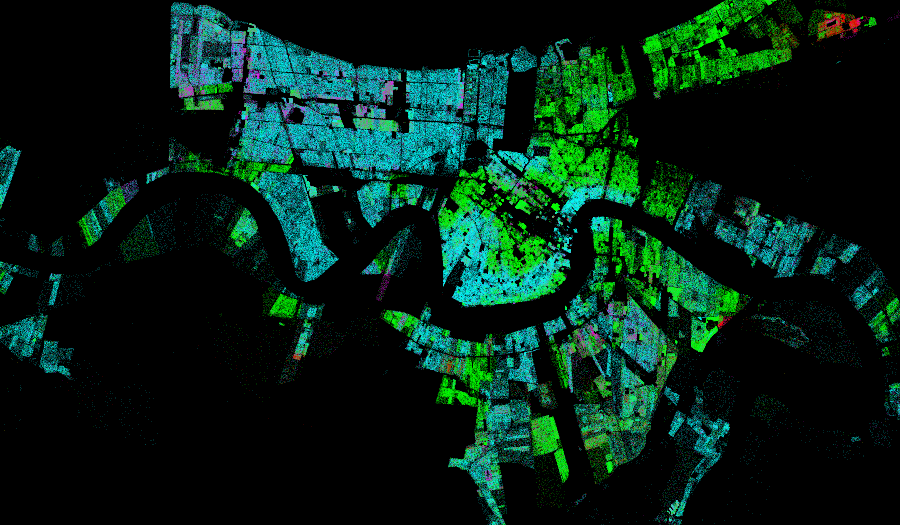

In [53]:
create_census_image(NewOrleans[0], NewOrleans[1])

### Can we learn more than just population density and race?

We can use *xarray* to slice the array of aggregated pixel values to examine specific aspects of the data.

### Question: Where do African Americans live?

Use the `sel()` function of the *xarray* array

In [317]:
# Step 1: Setup canvas
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height)

# Step 2: Aggregate and count race category
aggc = cvs.points(census_ddf, "easting", "northing", agg=ds.count_cat("race"))

# NEW: Select only African Americans (where "race" column is equal to "b")
agg_b = aggc.sel(race="b")

agg_b

<xarray.DataArray (northing: 525, easting: 900)> Size: 2MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint32)
Coordinates:
  * easting   (easting) float64 7kB -1.388e+07 -1.387e+07 ... -7.457e+06
  * northing  (northing) float64 4kB 2.822e+06 2.828e+06 ... 6.326e+06 6.333e+06
    race      <U1 4B 'b'
Attributes:
    x_range:  (-13884029.0, -7453303.5)
    y_range:  (2818291.5, 6335972.0)

In [318]:
import colorcet

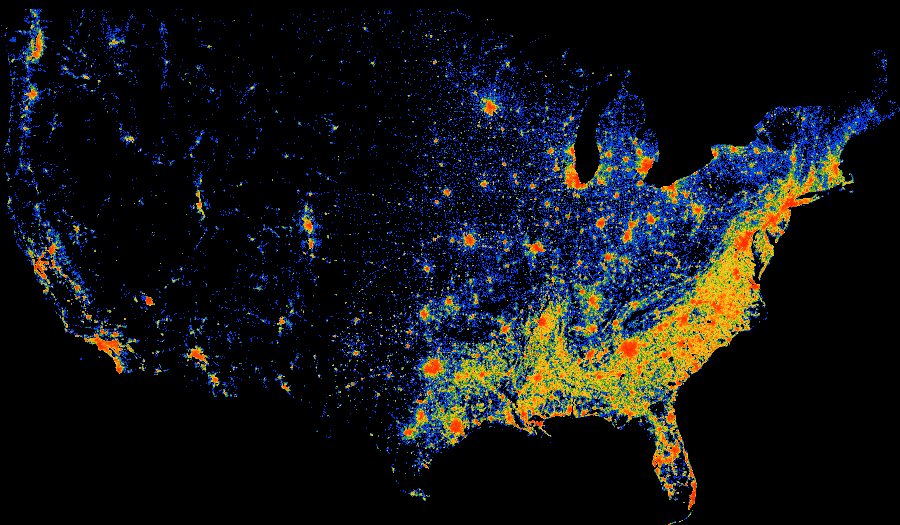

In [319]:
# Step 3: Shade and set background
img = tf.shade(agg_b, cmap=colorcet.rainbow, how="eq_hist")
img = tf.set_background(img, "black")

img

### Question: How to identify diverse areas?

**Goal:** Select pixels where each race has a non-zero count.

In [320]:
bool_sel = aggc.sel(race=['w', 'b', 'a', 'h']) > 0

bool_sel

<xarray.DataArray (northing: 525, easting: 900, race: 4)> Size: 2MB
array([[[False, False, False, False],
        [False, False, False, False],
        [False, False, False, False],
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]],

       [[False, False, False, False],
        [False, False, False, False],
        [False, False, False, False],
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]],

       [[False, False, False, False],
        [False, False, False, False],
        [False, False, False, False],
        ...,
...
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]],

       [[False, False, False, False],
        [False, False, False, False],
        [False, False, False, False],
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]],

       [[False, False, False, False],
        [False, False, False, False],
        [False, False, False, False],
        ...,
        [False, False, False, False],
        [False, False, False, False],
        [False, False, False, False]]])
Coordinates:
  * easting   (easting) float64 7kB -1.388e+07 -1.387e+07 ... -7.457e+06
  * northing  (northing) float64 4kB 2.822e+06 2.828e+06 ... 6.326e+06 6.333e+06
  * race      (race) <U1 16B 'w' 'b' 'a' 'h'

In [321]:
# Do a "logical and" operation across the "race" dimension
# Pixels will be "True" if the pixel has a positive count for each race
diverse_selection = bool_sel.all(dim='race')

diverse_selection

<xarray.DataArray (northing: 525, easting: 900)> Size: 472kB
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * easting   (easting) float64 7kB -1.388e+07 -1.387e+07 ... -7.457e+06
  * northing  (northing) float64 4kB 2.822e+06 2.828e+06 ... 6.326e+06 6.333e+06

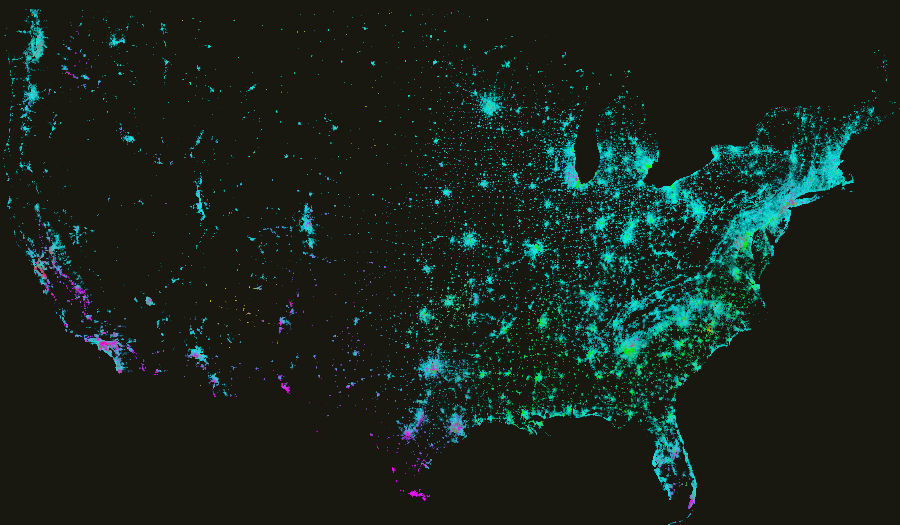

In [322]:
# Select the pixel values where our diverse selection criteria is True
agg2 = aggc.where(diverse_selection).fillna(0)

# and shade using our color key
img = tf.shade(agg2, color_key=color_key, how='eq_hist')
img = tf.set_background(img,"black")

img 

### Question: Where is African American population greater than the White population?


In [323]:
# Select where the "b" race dimension is greater than the "w" race dimension
selection = aggc.sel(race='b') > aggc.sel(race='w') 

selection

<xarray.DataArray (northing: 525, easting: 900)> Size: 472kB
array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])
Coordinates:
  * easting   (easting) float64 7kB -1.388e+07 -1.387e+07 ... -7.457e+06
  * northing  (northing) float64 4kB 2.822e+06 2.828e+06 ... 6.326e+06 6.333e+06

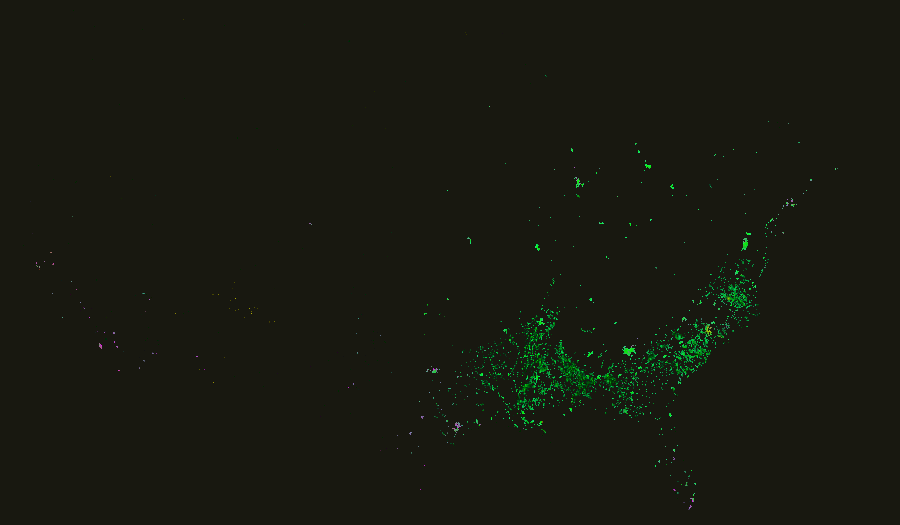

In [324]:
# Select based on the selection criteria
agg3 = aggc.where(selection).fillna(0)

img = tf.shade(agg3, color_key=color_key, how="eq_hist")
img = tf.set_background(img, "black")

img

## To be continued...